주어진 음악 녹음에 대한 구조적(structural) 분석과 시간적 분할(segmentation)를 소개하고, 반복성(repitition), 동질성(homogeneity) 및 새로움(novelty)을 기반으로 하는 기본 분할 원칙에 대해 논의한다. 

> 이 글은 [FMP(Fundamentals of Music Processing) Notebooks](https://www.audiolabs-erlangen.de/resources/MIR/FMP/C0/C0.html)을 참고로 합니다.

In [2]:
import IPython.display as ipd
import librosa
import librosa.display
import numpy as np; import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

from scipy import signal
from scipy.interpolate import interp1d

from utils.plot_tools import plot_chromagram, plot_matrix, plot_segments, plot_signal, plot_segments_overlay
from utils.feature_tools import smooth_downsample_feature_sequence, normalize_feature_sequence

# 음악 구조 분석의 일반 원칙

- 음악 구조 분석(music structure analysis)은 다양한 측면에 의존하는 다면적이고 정의가 모호한 문제이다. 
- 우선 문제의 복잡성은 분석할 음악 표현의 종류에 따라 다르다. 예를 들어 악보에서 반복되는 멜로디와 같은 특정 구조를 감지하는 것은 비교적 쉬운 반면, 오디오 표현에서는 어렵다. 
- 둘째, 분할(segmentation)의 기반이 될 수 있는 **동질성**, **반복**, **새로움** 등 다양한 원칙이 있다. 
- 셋째, 멜로디, 하모니, 리듬 또는 음색과 같은 다양한 음악적 차원을 설명해야 한다. 마지막으로 분할(segmentation)과 구조(structure)는 음악적 맥락과 고려해야 할 **시간적 계층(temporal hierarchy)** 에 따라 크게 달라진다. 
- 다음 그림은 음악 구조를 다룰 때 고려해야 할 다양한 측면에 대한 개요를 제공한다.

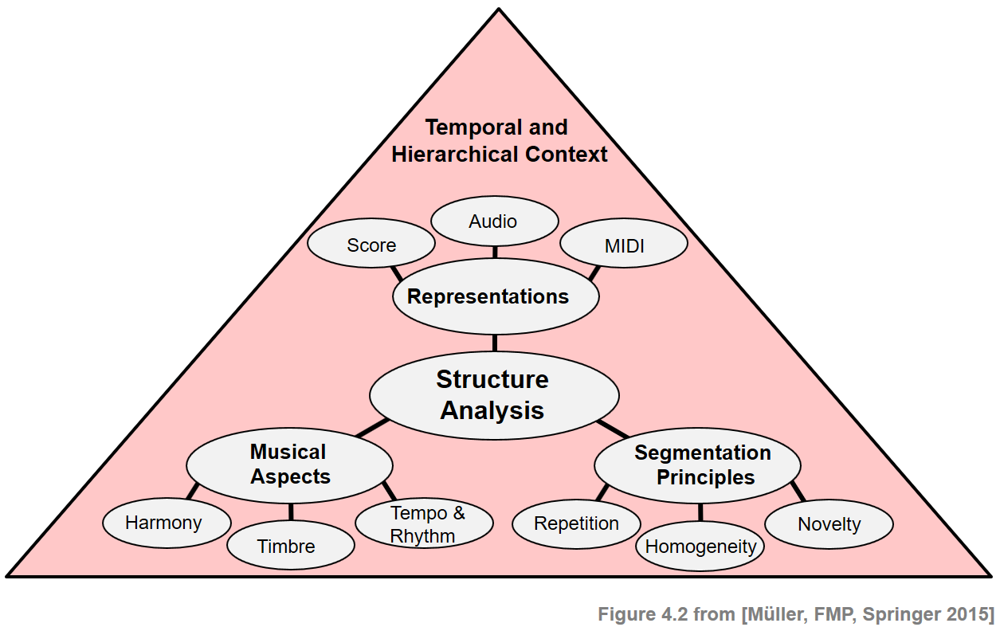

In [3]:
ipd.Image("../img/5.music_structure_analysis/FMP_C4_F02.png", width=600)

## 분할과 구조 분석 (Segmentation and Structure Analysis)

- **분할/세분화(Segmentation)** 은 일반적으로 원본보다 더 의미 있고 분석하기 쉬운 것으로 표시를 단순화하기 위해 지정된 문서를 여러 세그먼트로 분할하는 과정을 말한다. 예를 들어 이미지 처리에서 목표는 주어진 이미지를 영역 집합으로 분할하여 각 영역이 색상, 강도 또는 질감과 같은 일부 특성과 관련하여 유사하도록 하는 것이다. 영역 경계는 종종 이미지 밝기 또는 기타 속성이 급격하게 변하고 불연속성을 나타내는 등고선이나 가장자리로 설명될 수 있다. 
- 음악에서 분할 작업은 주어진 오디오 스트림을 음향적으로 의미 있는 **섹션**으로 분해하는 것이다. 각각은 시작 및 종료 **경계(boundary)** 로 지정된 연속 시간 간격에 해당한다. 
- 미세한 수준에서의 분할은 개별 음 사이의 경계를 찾거나 비트 위치에 의해 지정된 비트 간격을 찾는 것을 목표로 할 수 있다. 대략적인 수준에서의 목표는 악기나 화음의 변화를 감지하거나 절(verse)과 합창 부분 사이의 경계를 찾는 것일 수 있다. 또한 침묵, 말, 음악을 구별하거나 실제 음악 녹음의 시작 부분을 찾거나 공연이 끝난 후 박수를 분리하는 것이 전형적인 분할 작업이다.

- **구조 분석(structural analysis)** 의 목표는 단순한 분할을 넘어 세그먼트 간의 관계를 찾고 이해하는 것이다. 
- 예를 들어, 특정 세그먼트는 악기에 의해 특징지어질 수 있다. 현악기로만 연주되는 구간이 있을 수 있으며, 전체 오케스트라가 연주하는 섹션 다음에 솔로 섹션이 이어질 수 있다. 노래하는 목소리가 있는 절 부분은 순전히 기악 부분으로 대체될 수 있다. 또는 부드럽고 느린 도입부 부분이 훨씬 빠른 템포로 연주되는 메인 테마 앞에 나올 수 있다. 
- 또한 섹션이 자주 반복된다. 대부분의 음악 관련 이벤트는 어떤 식으로든 반복된다. 그러나 반복은 원래 섹션과 거의 동일하지 않으며 가사, 악기 또는 멜로디와 같은 측면에서 조금씩 수정된다. 구조 분석의 주요 작업 중 하나는 주어진 음악 녹음을 분할하는 것뿐만 아니라 세그먼트를 음악적으로 의미 있는 범주(예: 인트로, 코러스, 절, 아웃트로)로 그룹화하는 것이다.

- 전산 음악 구조 분석의 문제는 음악의 구조가 **반복**, **대조**, **변형** 및 **동질성**을 비롯한 다양한 종류의 **관계**에서 발생한다는 것이다. 음악 구조에 결정적으로 영향을 미치는 다양한 원리를 고려하여 음악 구조 분석에 대한 다양한 접근 방식이 많이 개발되었다. 세 가지 방법 분류를 대략적으로 구분해보자.

    * 첫째, **반복(repetition) 기반** 방법은 반복 패턴을 식별하는 데 사용된다.
    * 둘째, **새로움(novelty) 기반** 방법을 사용하여 대조되는 부분 간의 전환을 감지한다.
    * 셋째, **동질성(homogeneity) 기반** 방법은 일부 음악적 속성과 관련하여 일관된 구절을 결정하는 데 사용된다.

- 새로움 기반 및 동질성 기반 접근 방식은 동전의 양면 같다. 새로움 감지는 더 동질적인 세그먼트 이후의 놀라운 이벤트 또는 변화를 관찰하는 것을 기반으로 한다. 새로움 감지의 목적은 변경 사항의 시간 위치를 찾는 것이지만 동질성 분석의 초점은 일부 음악적 속성과 관련하여 일관성 있는 더 긴 악절을 식별하는 데 있다. 

- 다음 그림은 유사한 분할 및 구조화 원칙이 이미지 및 3D 데이터와 같은 다른 도메인에 적용됨을 보여준다.

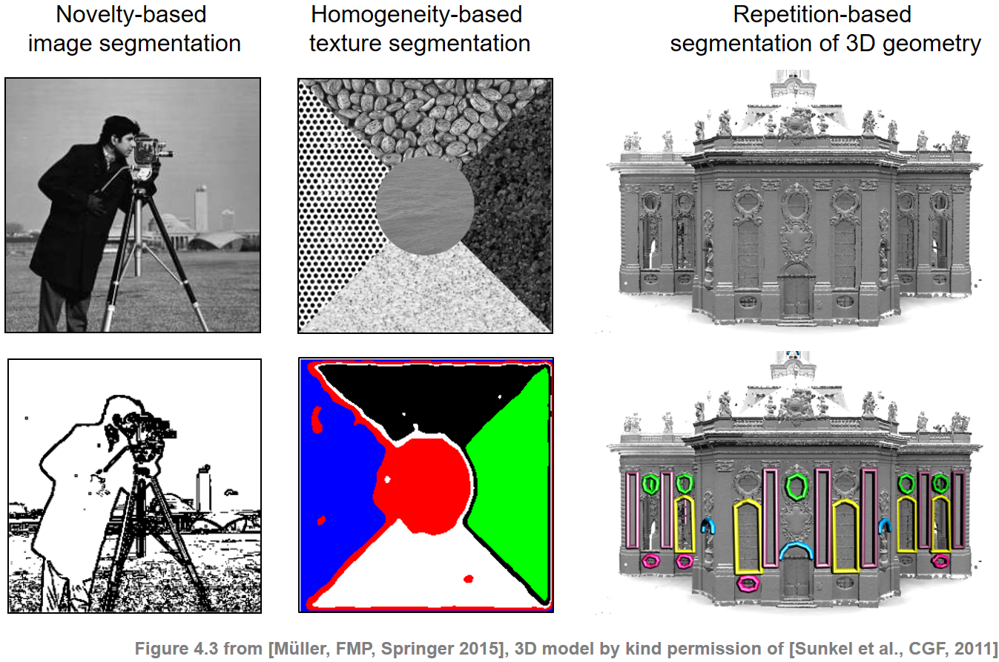

In [40]:
ipd.Image("../img/5.music_structure_analysis/FMP_C4_F03_text.png", width=600)

## 음악 구조 (Musical Structure)

- 음악 구조를 구체화하기 위해 몇 가지 용어를 소개한다. 먼저 **음악 작품**(**a piece of music**)(다소 추상적인 의미)과 특정 **오디오 녹음**(**audio recording**)(실제 연주)을 구분해야 한다. **파트(part)** 라는 용어는 추상적인 음악 영역에서 사용되는 반면 **세그먼트(segment)** 라는 용어는 오디오 영역에서 사용된다. 
- 음악적 파트는 일반적으로 처음 나타나는 순서대로 대문자 $A,B,C,\ldots$로 표시되며 여기서 숫자(종종 아래 첨자로 표시됨)는 반복되는 순서를 나타낸다. 
- 예를 들어 요하네스 브람스의 헝가리 무곡 5번을 생각해보자. 이 춤은 피아노 버전에서 풀 오케스트라 버전에 이르기까지 다양한 악기와 앙상블을 위해 편곡되었다. 다음 그림은 전체 오케스트라를 위한 편곡의 바이올린 음성에 대한 악보 표현을 보여준다.

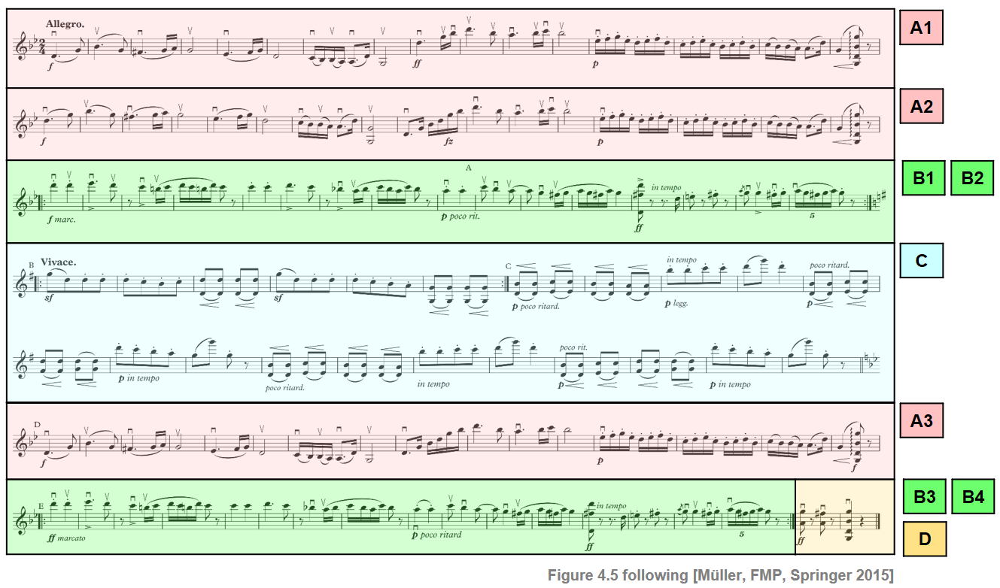

In [41]:
ipd.Image("../img/5.music_structure_analysis/FMP_C4_F05_Sibelius_annotated.png", width=600)

- 음악적 구조는 $A_1A_2B_1B_2CA_3B_3B_4D$로 $A$ 파트 3개, $B$ 파트 4개, $C$ 파트 1개, 닫는 $D$ 파트 1개로 구성되어 있다. $A$ 부분에는 두 개 이상 반복되는 하위 부분으로 구성된 하위 구조가 있다. 또한 악보를 보면 알 수 있듯이 중간 $C$ 부분은 $d_1d_2e_1e_2e_3e_4$로 설명할 수 있는 하위 구조로 더 분할될 수 있다. 악보에서 이러한 하위 부분은 종종 소문자 $a,b,c,\ldots$를 사용하여 표시된다.

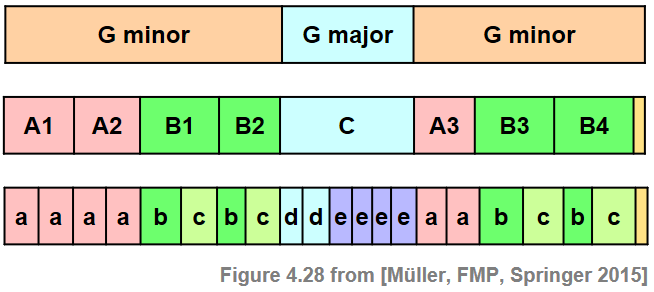

In [42]:
ipd.Image("../img/5.music_structure_analysis/FMP_C4_F28.png", width=400)

In [43]:
def convert_structure_annotation(ann, Fs=1, remove_digits=False, index=False):
    """Convert structure annotations

    Args:
        ann (list): Structure annotions
        Fs (scalar): Sampling rate (Default value = 1)
        remove_digits (bool): Remove digits from labels (Default value = False)
        index (bool): Round to nearest integer (Default value = False)

    Returns:
        ann_converted (list): Converted annotation
    """
    ann_converted = []
    for r in ann:
        s = r[0] * Fs
        t = r[1] * Fs
        if index:
            s = int(np.round(s))
            t = int(np.round(t))
        if remove_digits:
            label = ''.join([i for i in r[2] if not i.isdigit()])
        else:
            label = r[2]
        ann_converted = ann_converted + [[s, t, label]]
    return ann_converted


def read_structure_annotation(fn_ann, fn_ann_color, Fs=1, remove_digits=False, index=False):
    """Read and convert structure annotation and colors

    Args:
        fn_ann (str): Path and filename for structure annotions
        fn_ann_color (str): Filename used to identify colors (Default value = '')
        Fs (scalar): Sampling rate (Default value = 1)
        remove_digits (bool): Remove digits from labels (Default value = False)
        index (bool): Round to nearest integer (Default value = False)

    Returns:
        ann (list): Annotations
        color_ann (dict): Color scheme
    """
    df = pd.read_csv(fn_ann, sep=';', keep_default_na=False, header=0)
    ann = [(start, end, label) for i, (start, end, label) in df.iterrows()]
    ann = convert_structure_annotation(ann, Fs=Fs, remove_digits=remove_digits, index=index)
    color_ann = {}
    if len(fn_ann_color) > 0:
        color_ann = fn_ann_color
        if remove_digits:
            color_ann_reduced = {}
            for key, value in color_ann.items():
                key_new = ''.join([i for i in key if not i.isdigit()])
                color_ann_reduced[key_new] = value
            color_ann = color_ann_reduced
    return ann, color_ann

In [44]:
ann_color = {'A1': [1, 0, 0, 0.2], 'A2': [1, 0, 0, 0.2], 'A3': [1, 0, 0, 0.2],
                     'B1': [0, 1, 0, 0.2], 'B2': [0, 1, 0, 0.2], 'B3': [0, 1, 0, 0.2],
                     'B4': [0, 1, 0, 0.2], 'C': [0, 0, 1, 0.2], '': [1, 1, 1, 0]}

Original annotations with time specified in seconds
Annotations: [[0.0, 1.01, ''], [1.01, 22.11, 'A1'], [22.11, 43.06, 'A2'], [43.06, 69.42, 'B1'], [69.42, 89.57, 'B2'], [89.57, 131.64, 'C'], [131.64, 150.84, 'A3'], [150.84, 176.96, 'B3'], [176.96, 196.9, 'B4'], [196.9, 199.64, '']]
Colors: {'A1': [1, 0, 0, 0.2], 'A2': [1, 0, 0, 0.2], 'A3': [1, 0, 0, 0.2], 'B1': [0, 1, 0, 0.2], 'B2': [0, 1, 0, 0.2], 'B3': [0, 1, 0, 0.2], 'B4': [0, 1, 0, 0.2], 'C': [0, 0, 1, 0.2], '': [1, 1, 1, 0]}


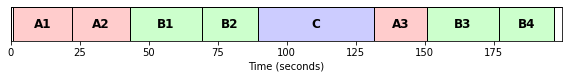

Converted annotations (Fs = 2) with reduced labels (removing digits)
Annotations: [[0, 2, ''], [2, 44, 'A'], [44, 86, 'A'], [86, 139, 'B'], [139, 179, 'B'], [179, 263, 'C'], [263, 302, 'A'], [302, 354, 'B'], [354, 394, 'B'], [394, 399, '']]
Colors: {'A': [1, 0, 0, 0.2], 'B': [0, 1, 0, 0.2], 'C': [0, 0, 1, 0.2], '': [1, 1, 1, 0]}


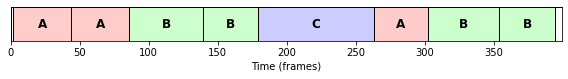

In [45]:
# Annotation file
fn_ann = "../data_FMP/FMP_C4_Audio_Brahms_HungarianDances-05_Ormandy.csv"

# Read annotations
ann, color_ann = read_structure_annotation(fn_ann, fn_ann_color=fn_ann_color)
print('Original annotations with time specified in seconds')
print('Annotations:', ann)
print('Colors:', color_ann)
fig, ax = plot_segments(ann, figsize=(8, 1.2), colors=color_ann, time_label='Time (seconds)')
plt.show()

# Read and convert annotations
Fs = 2
ann, color_ann = read_structure_annotation(fn_ann, fn_ann_color=fn_ann_color, Fs=Fs, remove_digits=True, index=True)
print('Converted annotations (Fs = %d) with reduced labels (removing digits)'%Fs)
print('Annotations:', ann)
print('Colors:', color_ann)
fig, ax = plot_segments(ann, figsize=(8, 1.2), colors=color_ann, time_label='Time (frames)')
plt.show()

# 음악적 차원의 분할

- 다양한 분할 원리(segmentation principle)의 적용 가능성은 분석할 오디오 신호의 음악적 및 음향적 특성에 크게 좌우된다. 예를 들어, 구조적 경계(bounadary)는 화음, 음색 또는 템포의 변화를 기반으로 할 수 있다.
- 구조 분석의 첫 번째 단계는 주어진 음악 녹음을 관련 음악 속성을 캡처하는 적절한 **특징 표현**으로 변환하는 것이다. 다음에서는 세 가지 다른 유형의 특징(feature) 표현(크로마그램, MFFC, 템포그램)을 살펴본다. 
- 또한 하나의 특징 유형의 경우에도 특징 표현 품질에 상당한 영향을 미치는 많은 변형과 다양한 매개변수 설정이 있다.

In [47]:
fn_wav = '../data_FMP/FMP_C4_Audio_Brahms_HungarianDances-05_Ormandy.wav'
x, Fs = librosa.load(fn_wav)
ipd.Audio(x,rate=Fs)

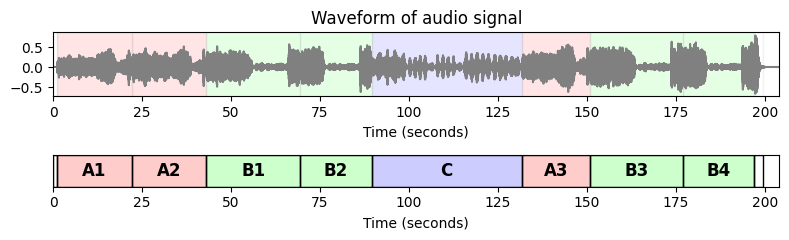

In [48]:
# Annotations
fn_ann = '../data_FMP/FMP_C4_Audio_Brahms_HungarianDances-05_Ormandy.csv'
ann, color_ann = read_structure_annotation(fn_ann, fn_ann_color=ann_color, Fs=1, remove_digits=False)

# Waveform
fn_wav = '../data_FMP/FMP_C4_Audio_Brahms_HungarianDances-05_Ormandy.wav'
x, Fs = librosa.load(fn_wav) 
x_dur = x.shape[0]/Fs

# Visualization
fig, ax = plt.subplots(2, 1, gridspec_kw={'width_ratios': [1], 
                                          'height_ratios': [1, 0.5]}, figsize=(8, 2.5))   
plot_signal(x, Fs, ax=ax[0], title='Waveform of audio signal')

plot_segments_overlay(ann, ax=ax[0], time_max=x_dur,
                print_labels=False,  label_ticks=False, edgecolor='gray',
                colors = color_ann, fontsize=10, alpha=0.1)
    
plot_segments(ann, ax=ax[1], time_max=x_dur, 
                       colors=color_ann, time_label='Time (seconds)')
plt.tight_layout()

## 크로마그램

- 첫째, **크로마 기반 표현**은 음악 녹음의 **화성(harmonic)** 및 **멜로디(melodic) 속성**과 관련된다. 
- 크로마그램에서 볼 수 있는 패턴은 중요한 구조 정보를 나타낸다. 

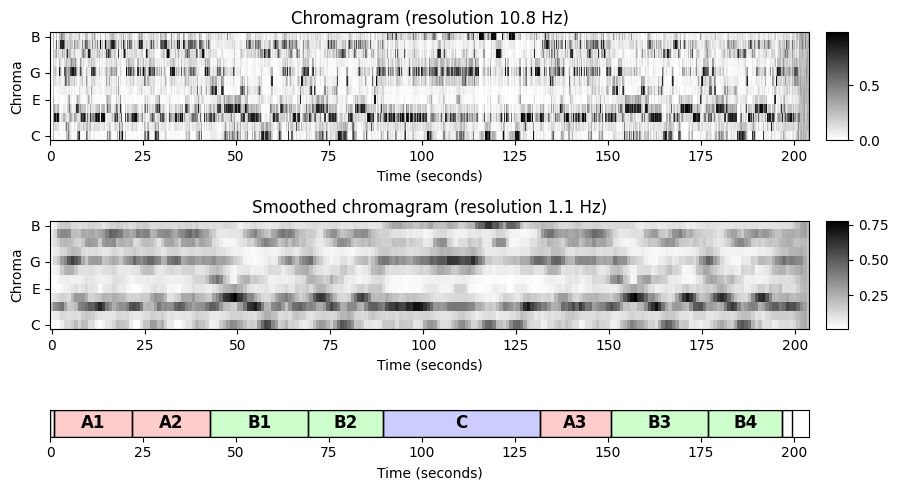

In [50]:
# Chromagram
N, H = 4096, 2048
chromagram = librosa.feature.chroma_stft(y=x, sr=Fs, tuning=0, norm=2, hop_length=H, n_fft=N)

filt_len = 41
down_sampling = 10
filt_kernel = np.ones([1,filt_len])
chromagram_smooth =  signal.convolve(chromagram, filt_kernel, mode='same')/filt_len
chromagram_smooth = chromagram_smooth[:,::down_sampling]
chromagram_smooth, Fs_smooth = smooth_downsample_feature_sequence(chromagram, 
                        Fs/H, filt_len=filt_len, down_sampling=down_sampling)

# Visualization
fig, ax = plt.subplots(3, 2, gridspec_kw={'width_ratios': [1, 0.03], 
                                          'height_ratios': [2, 2, 0.5]}, figsize=(9, 5))       
plot_chromagram(chromagram, Fs=Fs/H, ax=[ax[0,0], ax[0,1]],  
                         chroma_yticks = [0,4,7,11], 
                         title='Chromagram (resolution %0.1f Hz)'%(Fs/H), 
                         ylabel='Chroma', colorbar=True);
plot_chromagram(chromagram_smooth, Fs_smooth, ax=[ax[1,0], ax[1,1]],  
                         chroma_yticks = [0,4,7,11], 
                         title='Smoothed chromagram (resolution %0.1f Hz)'%Fs_smooth, 
                         ylabel='Chroma', colorbar=True);
plot_segments(ann, ax=ax[2,0], time_max=x_dur, 
                       colors=color_ann, time_label='Time (seconds)')
ax[2,1].axis('off')

plt.tight_layout()

- AABBCABB
- 4개의 반복되는 $B$ 부분 세그먼트는 크로마그램에서 4개의 유사한 특성 하위 시퀀스로 명확하게 표시된다. 
- 또한 $C$ 부분 세그먼트는 전체 섹션에서 높은 수준의 동질성을 보여줌으로써 크로마그램에서 두드러진다. 실제로 이 세그먼트의 모든 크로마 기능에 대해 대부분의 신호 에너지는 $\mathrm{G}$-, $\mathrm{B}$- 및 $\mathrm{D}$-대역에 포함된다(이는 $C$ 부분이 $\mathrm{G}$ major에 있기 때문에 놀라운 일은 아니다). 
- 대조적으로, $A$ 부분 세그먼트의 경우 많은 크로마 벡터가 $\mathrm{G}$-, $\mathrm{B}^\flat$- 및 $\mathrm{D}$에 지배적으로 분포한다.

## MFCC 표현

- 멜로디와 하모니 외에도 악기와 음색(timbre)의 특성은 음악 구조에 대한 인간의 인식에 매우 중요하다. 
- 음색 기반 구조 분석의 맥락에서 원래 자동 음성 인식용으로 개발된 **MFCC(mel-frequency cepstral coefficients)** 를 자주 사용한다. 
- 음악의 경우 MFFC 기반 특징은 **악기 및 음색**과 같은 측면과 상관관계가 있는 중간 수준(mid-level)의 표현이다. 
-  노래하는 목소리가 있는 섹션과 악기 섹션이 번갈아 나타나는 팝송과 같은 많은 음악 녹음의 경우 MFCC 기반 특징 표현은 새로움(novelty) 기반 및 동질성 기반 분할에 매우 적합하다.

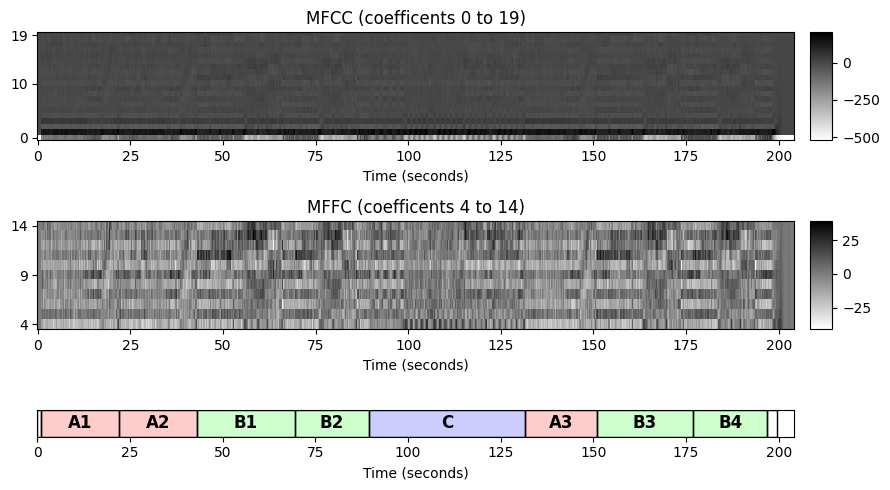

In [51]:
# MFCC
N, H = 4096, 2048
X_MFCC = librosa.feature.mfcc(y=x, sr=Fs, hop_length=H, n_fft=N)
coef = np.arange(4,15)
X_MFCC_upper = X_MFCC[coef,:]

# Visualization
fig, ax = plt.subplots(3, 2, gridspec_kw={'width_ratios': [1, 0.03], 
                                          'height_ratios': [2, 2, 0.5]}, figsize=(9, 5))       
plot_matrix(X_MFCC, Fs=Fs/H, ax=[ax[0,0], ax[0,1]], 
                     title='MFCC (coefficents 0 to 19)', ylabel='', colorbar=True);
ax[0,0].set_yticks([0, 10, 19])
plot_matrix(X_MFCC_upper, Fs=Fs/H, ax=[ax[1,0], ax[1,1]], 
                     title='MFFC (coefficents 4 to 14)', ylabel='', colorbar=True);
ax[1,0].set_yticks([0, 5, 10])
ax[1,0].set_yticklabels(coef[0] + [0, 5, 10])
plot_segments(ann, ax=ax[2,0], time_max=x_dur, 
                       colors=color_ann, time_label='Time (seconds)');  
ax[2,1].axis('off')
plt.tight_layout()

- $A$ 부분 세그먼트 내의 MFCC 기능이 $B$ 부분 및 $C$ 부분 세그먼트의 기능과 다르다는 것을 인식할 수 있다.

## 템포그램 (Tempogram) 표현

- 음악 구조 분석에서 템포 및 비트 정보는 동질성 기반 분할 접근 방식과 함께 사용될 수도 있다. 이러한 정보를 명시적으로 추출하는 대신, 템포 및 리듬과 관련된 중간-수준의 특징 표현으로 더 높은 구조 수준에서 의미 있는 분할을 유도하는 데 충분할 수 있다. 
- 로컬 **템포 정보**를 인코딩하는 중간-수준 표현인 **템포그램**을 사용한다. 
- 템포그램의 순환 변형이 표시되며 여기서 2의 거듭제곱 차이가 나는 템포가 식별된다. 옥타브별로 다른 피치가 식별되는 순환 크로마 특징과 유사하다. 템포그램 표현을 살펴보면 다양한 음악 파트가 다른 템포로 연주된다는 것을 알 수 있다(단, 표현이 정확한 템포를 나타내지는 않지만). 또한 템포그램 특징에 지배적인 항목이 없는 섹션이 있는데, 이는 녹음에 템포에 대한 명확한 개념이 없음을 나타낼 수 있다.

(자세한 것은 템포에 대해 다루는 챕터에서 보기로 한다.)

In [52]:
import utils.tempo_tools as tmpo

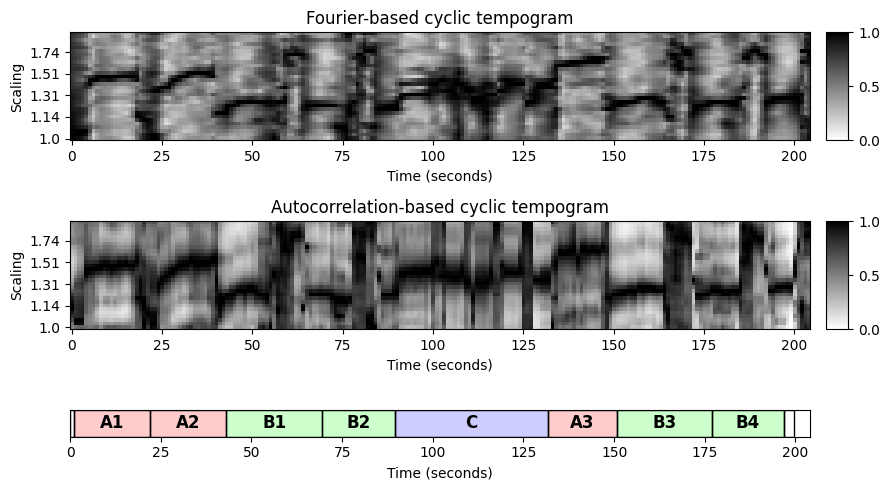

In [54]:
# Tempogram
nov, Fs_nov = tmpo.compute_novelty_spectrum(x, Fs=Fs, N=2048, H=512, gamma=100, M=10, norm=True)
nov, Fs_nov = tmpo.resample_signal(nov, Fs_in=Fs_nov, Fs_out=100)

X, T_coef, F_coef_BPM = tmpo.compute_tempogram_fourier(nov, Fs_nov, N=1000, H=100, Theta=np.arange(30, 601))

octave_bin = 30
tempogram_F = np.abs(X)
output = tmpo.compute_cyclic_tempogram(tempogram_F, F_coef_BPM, octave_bin=octave_bin)
tempogram_cyclic_F = output[0]
F_coef_scale = output[1]
tempogram_cyclic_F = normalize_feature_sequence(tempogram_cyclic_F, norm='max')

output = tmpo.compute_tempogram_autocorr(nov, Fs_nov, N=500, H=100, norm_sum=False,
                                              Theta=np.arange(30, 601))
tempogram_A = output[0]
T_coef = output[1]
F_coef_BPM = output[2]

output = tmpo.compute_cyclic_tempogram(tempogram_A, F_coef_BPM, octave_bin=octave_bin)
tempogram_cyclic_A = output[0]
F_coef_scale = output[1]
tempogram_cyclic_A = normalize_feature_sequence(tempogram_cyclic_A, norm='max')

# Visualization
fig, ax = plt.subplots(3, 2, gridspec_kw={'width_ratios': [1, 0.03], 
                                          'height_ratios': [2, 2, 0.5]}, figsize=(9, 5))       

plot_matrix(tempogram_cyclic_F, T_coef=T_coef, ax=[ax[0,0], ax[0,1]], 
                     title='Fourier-based cyclic tempogram', ylabel='Scaling',
                     colorbar=True, clim=[0, 1])
tmpo.set_yticks_tempogram_cyclic(ax[0,0], octave_bin, F_coef_scale, num_tick=5)

plot_matrix(tempogram_cyclic_A, T_coef=T_coef, ax=[ax[1,0], ax[1,1]], 
                     title='Autocorrelation-based cyclic tempogram', ylabel='Scaling',
                     colorbar=True, clim=[0, 1])
tmpo.set_yticks_tempogram_cyclic(ax[1,0], octave_bin, F_coef_scale, num_tick=5)

plot_segments(ann, ax=ax[2,0], time_max=x_dur, 
                       colors=color_ann, time_label='Time (seconds)')
ax[2,1].axis('off')

plt.tight_layout()

- 다양한 음악적 차원 외에도 적절한 특징 표현을 찾을 때 염두에 두어야 할 또 다른 측면이 있다. 바로 시간적(temporal) 차원이다. 위에서 언급한 모든 특징 표현에서 분석 창(winodw)은 음악 신호 위로 이동한다. 

- 분명히 분석 윈도우의 길이와 홉 크기 매개변수는 특징 표현의 품질에 결정적인 영향을 미친다. 예를 들어 긴 윈도우 크기와 큰 홉 크기는 동질성 기반 분할에서 종종 원하는 속성인 관련 없는 로컬 변형을 부드럽게 하는 데 도움이 될 수 있다. 단점은 시간적 해상도가 감소하고 중요한 세부 정보가 손실될 수 있어 정확한 분할 경계를 찾을 때 문제가 발생할 수 있다는 것이다.

- 요약하면 특징 표현 및 매개변수 설정의 적절한 선택은 응용 맥락에 따라 크게 달라진다. 음악 구조의 풍부함과 다양성은 구조 분석을 어렵게 할 수 있다.

---

출처: 

- https://www.audiolabs-erlangen.de/resources/MIR/FMP/C4/C4S1_MusicStructureGeneral.html

---

[구글 Colab 링크](https://colab.research.google.com/github/jo-cho/mir_kr/blob/main/Notebooks/5.%20Music%20Structure%20Analysis/5.1.Music_Structure_and_Segmentation.ipynb)